In [17]:
import random, math

import matplotlib.pyplot as plt
import numpy as np

In [18]:
def Exposure(best_group,arm_cur_Er, group_to_arm, N_g_t, N_t) :
  pi_t=[]
  best_arm = 0
  sum_arm_group_mean_t_ucb=0
  arm_group_mean_t_ucb=np.zeros(len(N_t),dtype=float)
    #print("group_to_arm[best_group]", group_to_arm[best_group])
  #########################################################################################################

  for  i in group_to_arm[best_group]:
    #Arm estimated Reward
    arm_group_mean_t_ucb[i] = arm_cur_Er[i] + math.sqrt(2 * math.log(4*N_g_t[best_group]*len(group_to_arm[best_group]))/delta) * 1.0 / math.sqrt(N_t[i])
    if arm_group_mean_t_ucb[i]>=1:
      arm_group_mean_t_ucb[i]=1
    sum_arm_group_mean_t_ucb+=arm_group_mean_t_ucb[i]

  for  i in group_to_arm[best_group]:
    pi_t.append(arm_group_mean_t_ucb[i]/sum_arm_group_mean_t_ucb)

  data = list(zip(pi_t, group_to_arm[best_group]))

  t = sorted(data, key=lambda t: t[0])


  sum_prob=0
  ##################Pull best arm with Exposure#############################################
  select_random= np.round(random.random(),3)
  for i in range(0,len(group_to_arm[best_group]),1):
    sum_prob+=t[i][0]
    if(select_random<sum_prob):
      best_arm=t[i][1]
      break
  return pi_t, best_arm

In [19]:
def Exposure_full(best_group,arm_cur_Er, N_t, iteration) :
  pi_t=[]
  best_arm = 0
  sum_arm_group_mean_t_ucb=0
  arm_group_mean_t_ucb=np.zeros(len(N_t),dtype=float)
    #print("group_to_arm[best_group]", group_to_arm[best_group])
  #########################################################################################################

  for  i in best_group:
    #Arm estimated Reward
    arm_group_mean_t_ucb[i] = arm_cur_Er[i] + math.sqrt(2 * math.log(4*iteration*len(best_group))/delta) * 1.0 / math.sqrt(N_t[i])
    if arm_group_mean_t_ucb[i]>=1:
      arm_group_mean_t_ucb[i]=1
    sum_arm_group_mean_t_ucb+=arm_group_mean_t_ucb[i]

  for  i in best_group:
    pi_t.append(arm_group_mean_t_ucb[i]/sum_arm_group_mean_t_ucb)

  data = list(zip(pi_t, best_group))

  t = sorted(data, key=lambda t: t[0])


  sum_prob=0
  ##################Pull best arm with Exposure#############################################
  select_random= np.round(random.random(),3)
  for i in range(0,len(best_group),1):
    sum_prob+=t[i][0]
    if(select_random<sum_prob):
      best_arm=t[i][1]
      break
  return best_arm

In [20]:
def sample_from_distribution(arm_prob):
     reward_prob = random.random()
    # #print val,
     if reward_prob <= arm_prob:
         return 1.0 #reward value with probability
     else:
         return 0.0
    #return arm_prob

In [21]:
def unfair_set(num_arms, num_groups,iterations,N_g_t_l,beta_g):

  UFG_set=[]
  UFG_set_dist= np.zeros(num_groups,dtype=float)
  # for i in range(num_arms):
  #     arm_group_mean_t_ucb[arm_i_g] = arm_cur_Er[arm_i_g] + math.sqrt(2 * math.log(4*N_g_t[j]*len(group_to_arm[j]))/delta) * 1.0 / math.sqrt(N_t[arm_i_g])

  for j in range(num_groups):
      # print("group",j,"group pulls",N_g_t[j],"iterations ",iterations ,((beta_g[j]*(iterations-1))-N_g_t[j]),UFG_set )
      #Group estimated Reward
      #group_mean_t_ucb[i] =  group_cur_Er[j] + math.sqrt(alpha * math.log(t+1) * 1.0 / (1 * N_g_t[j]))
      if ((beta_g[j]*(iterations-1))-N_g_t_l[j]) > 0:
        UFG_set.append(j)
        UFG_set_dist[j]= ( (beta_g[j]*(iterations-1))-(N_g_t_l[j]))
  return UFG_set_dist,UFG_set

In [22]:
def Learn(num_groups, arm_cur_Er, group_to_arm, N_g_t, N_t):
  pi_j_t=[] #estimated group means
  best_group=0
  arm_group_mean_t_ucb= np.zeros(len(N_t),dtype=float)
  for j in range(num_groups):
    sum=0
    sum_arm_group_mean_t_ucb=0
    for  i in group_to_arm[j]:
    #Arm estimated Reward
      arm_group_mean_t_ucb[i] = arm_cur_Er[i] + math.sqrt(2 * math.log(4*N_g_t[j]*len(group_to_arm[j]))/delta) * 1.0 / math.sqrt(N_t[i])
      if arm_group_mean_t_ucb[i]>=1:
        arm_group_mean_t_ucb[i]=1
      sum_arm_group_mean_t_ucb+=arm_group_mean_t_ucb[i]


    for  i in group_to_arm[j]:

      sum+=((arm_group_mean_t_ucb[i]*arm_group_mean_t_ucb[i])/sum_arm_group_mean_t_ucb)

    pi_j_t.append(sum)     #Each group estimated reward

  best_group= np.argmax(pi_j_t,axis=0)
  #print("best_group in learn function is",best_group)
  return best_group

In [23]:
def GenerateGroups():
  arm_prob=[]

  group_to_arm=[[],[]]
  group_idx=[]

  arm_prob.append(.9)  ####Going to group 1 10 arms
  arm_prob.append(.6)  #####Going to group 2 5arms
  group_idx.append(0)
  group_idx.append(1)
  num_arm=1
  group_to_arm[0].append(num_arm-1)
  group_to_arm[1].append(num_arm)
  arr=[10]
  arr2= [50]
  #################Generating rewards of group 1##############################
  ii=0
  for i in range(num_arm+1,arr[0]+1):
        # 1th index arm  at group 2
        arm_prob.append(round(random.uniform(.6,.8),3))
        num_arm=num_arm+1
        # add  arm index at group 2
        group_to_arm[1].append(num_arm)

        group_idx.append(1)
        print("arm_prob. group idx",arm_prob[num_arm],group_to_arm)
  #arm set for group 2
  jj=0
  for jj in range(len(arr2)):
    if jj==0:

      for ii in range(num_arm+1,num_arm+arr2[jj]-len(group_to_arm[0])+1):
            # index arm  at group 1
            arm_prob.append(round(random.uniform(.7,1),3))

            num_arm=num_arm+1
            # add  arm index at group 1
            group_to_arm[0].append(ii)

            group_idx.append(0)
            print("arm_prob. group idx",arm_prob[num_arm],group_to_arm)
            ii=ii+1

    else:
      jj=jj+1
      if(jj==len(arr2)):
        break;
      else:
        print("hi")
        #arms of group 2 incresed while keeping previous arms probabilities in arr2
        for ii in range(num_arm,num_arm+arr2[jj]-len(group_to_arm[0])):
            # index arm  at group 1
            ii=ii+1
            arm_prob.append(round(random.uniform(.7,1),3))

            num_arm=num_arm+1
            # add  arm index at group 1
            group_to_arm[0].append(ii)

            group_idx.append(0)
  print("arm_prob. group idx",arm_prob,group_to_arm)
  return arm_prob,group_to_arm,group_idx

In [24]:
def find_max_group_size(arm_prob,group_to_arm,group_idx):
  a=len(group_to_arm[0])
  b=len(group_to_arm[1])
  print(a,b)
  print("group_to_arm",group_to_arm)
  print("arm_prob",arm_prob)
  print("group_idx",group_idx)
  ###########Input Param###############
  ############################################imortant calculation of variables##################################################
  # alpha= 2
  num_arms= len(group_to_arm[0])+len(group_to_arm[1])

  num_groups=2
  if(a>b):
    max_group_size=a
  else:
    max_group_size=b
  return max_group_size, num_arms, num_groups

In [25]:
# 61844 75071 82304 82383 83049 76985 65385 56520 63480 58101 59996 61497 54457 64192 54736]

In [26]:
def compute_optimal(arm_prob,group_to_arm,group_idx,num_groups):
  group_best_policy=[] #weighted reward

  pi_j_optimal=0   #group with max weighted reward

  optimal_policy_sum=[]

  optimal_policy=[[],[]] # arm prob/sum(prob) in group

  optimal_policy_reward=[[],[]] #arm prob in group

  for group1 in range(num_groups):
    sum11=0
    ER=0
    for arms in group_to_arm[group1]:
      sum11+=arm_prob[arms]
    for arms in group_to_arm[group1]:
      ER+=((arm_prob[arms]/sum11)*arm_prob[arms])
  #Calculated Optimal Policy among group g and for each arm
    for arms in group_to_arm[group1]:
      optimal_policy[group1].append(arm_prob[arms]/sum11)
      optimal_policy_reward[group1].append(arm_prob[arms])

    group_best_policy.append(ER)
    print("group_best_policy",group_best_policy)
    print("optimal_policy",optimal_policy)
  max=0
  group_best_policy_ER=0 # value of group with max weighted reward

  #####group_best_policy_ER ,pi_j_optimal best policy and reward among groups
  for group1 in range(num_groups):
    if(max<= group_best_policy[group1]):
      group_best_policy_ER = group_best_policy[group1]
      pi_j_optimal = group1
      max = group_best_policy_ER
  return group_best_policy, group_best_policy_ER, pi_j_optimal, optimal_policy

In [27]:
def initialpulls(num_groups,arm_prob, max_group_size, group_to_arm, delta, group_idx, num_arms):
  iterations=0
  N_t=np.zeros(num_arms,dtype=int)# number of times arm pulled
  arm_cur_Er_g = [0]*num_arms
  group_cur_Er=[0]*num_groups
  N_g_t=np.zeros(num_groups,dtype=int)   #number of times group pulled
  arm_group_mean_t_ucb= np.zeros(num_arms,dtype=float)
  total_group_reward=[0]*num_groups
  total_reward = 0



  for j in range(num_groups):
          for i in range(max_group_size):
                if( N_g_t[j] < len(group_to_arm[j])):
                    # print(group_to_arm[j][N_g_t[j]])
                    arm_i_g= group_to_arm[j][N_g_t[j]]
                    # print("print",arm_i_g,N_t[arm_i_g])
                    if(N_t[arm_i_g]==0):
                        new_reward = sample_from_distribution(arm_prob[arm_i_g])
                        # print(new_reward)
                        arm_cur_Er_g[arm_i_g] = (N_t[arm_i_g] * arm_cur_Er_g[arm_i_g]  + new_reward) * 1.0 / (N_t[arm_i_g] + 1)

                        iterations=iterations+1
                        N_t[arm_i_g] = N_t[arm_i_g]+1
                        N_g_t[j]=N_g_t[j]+1

                        # arm_mean_t_ucb[arm_i_g] = arm_cur_Er[arm_i_g] + math.sqrt(2 * math.log(4*N_g_t[j]len(group_to_arm[j]))/delta) * 1.0 / math.sqrt(N_t[arm_i_g])
                        arm_group_mean_t_ucb[arm_i_g] = arm_cur_Er_g[arm_i_g] + math.sqrt(2 * math.log(4*N_g_t[j]*len(group_to_arm[j]))/delta) * 1.0 / math.sqrt(N_t[arm_i_g])
                        if(arm_group_mean_t_ucb[arm_i_g] >= 1):
                          arm_group_mean_t_ucb[arm_i_g] = 1

                        total_reward+=new_reward
                        total_group_reward[group_idx[arm_i_g]]+=new_reward

                else:
                      # print('star')
                      arm_index_g = random.randint(0, len(group_to_arm[j])-1)
                      arm_i_g=group_to_arm[j][arm_index_g]
                      new_reward = sample_from_distribution(arm_prob[arm_i_g])
                      # print(new_reward)
                      arm_cur_Er_g[arm_i_g] = (N_t[arm_i_g] * arm_cur_Er_g[arm_i_g]  + new_reward) * 1.0 / (N_t[arm_i_g] + 1)

                      iterations=iterations+1
                      N_t[arm_i_g] = N_t[arm_i_g]+1
                      N_g_t[j]=N_g_t[j]+1

                      # arm_mean_t_ucb[arm_i_g] = arm_cur_Er[arm_i_g] + math.sqrt(2 * math.log(4*N_g_t[j]len(group_to_arm[j]))/delta) * 1.0 / math.sqrt(N_t[arm_i_g])
                      arm_group_mean_t_ucb[arm_i_g] = arm_cur_Er_g[arm_i_g] + math.sqrt(2 * math.log(4*N_g_t[j]*len(group_to_arm[j]))/delta) * 1.0 / math.sqrt(N_t[arm_i_g])
                      if(arm_group_mean_t_ucb[arm_i_g] >= 1):
                          arm_group_mean_t_ucb[arm_i_g] = 1

                      total_reward+=new_reward
                      #total_group_reward[group_idx[arm_i_g]]+=new_reward
  return iterations, total_reward, arm_cur_Er_g, N_t, N_g_t

In [28]:
def save_file(N_g_t_ouralgo, N_g_t_UCB, N_g_t_EF, N_g_t_GF, N_t_ouralgo, N_t_UCB, N_t_EF, N_t_GF,i):
    filename =i
    with open(r'N_g_t_ouralgo_list_'+str(filename)+'.txt', 'a') as fp:
        fp.write("[")
        for each in N_g_t_ouralgo:
            
            
                # write each item on a new line
            fp.write("%s ," % each)
        fp.write("],\n")
            
    
   
    
    with open(r'N_g_t_UCB_list_'+str(filename)+'.txt', 'a') as fp:
        fp.write("[")
        for each in N_g_t_UCB:
           
                # write each item on a new line
            fp.write("%s ," % each)
        fp.write("],\n")
           
    
   
    
    
    with open(r'N_g_t_EF_list_'+str(filename)+'.txt', 'a') as fp:
        fp.write("[")
        for each in  N_g_t_EF:
            
                # write each item on a new line
            fp.write("%s ," % each)
        fp.write("],\n")
           
    
  
    with open(r'N_g_t_GF_list_'+str(filename)+'.txt', 'a') as fp:
        fp.write("[")
        for each in N_g_t_GF:
            
                # write each item on a new line
            fp.write("%s ," % each)
        fp.write("],\n")
            
    
   
    
    with open(r'N_t_ouralgo_list_'+str(filename)+'.txt', 'a') as fp:
        fp.write("[")
        for each in N_t_ouralgo:
            
                # write each item on a new line
            fp.write("%s ," % each)
        fp.write("],\n")
            
    
    
    
    with open(r'N_t_UCB_list_'+str(filename)+'.txt', 'a') as fp:
        fp.write("[")
        for each in N_t_UCB:
            
                # write each item on a new line
            fp.write("%s ," % each)
        fp.write("],\n")
            
    
    
    
    with open(r'N_t_EF_list_'+str(filename)+'.txt', 'a') as fp:
        fp.write("[")
        for each in N_t_EF:
            
            
                # write each item on a new line
            fp.write("%s ," % each)
        fp.write("],\n")
           
    
    
    
    with open(r'N_t_GF_list_'+str(filename)+'.txt', 'a') as fp:
        fp.write("[")
        for each in N_t_GF:
            
                # write each item on a new line
            fp.write("%s ," % each)
        fp.write("],\n")
        
    
   


In [29]:


def save_file2(list_total_reward_ouralgo,list_total_reward_UCB,list_total_reward_EF,list_total_reward_GF,list_total_regret_ouralgo,list_exposure_fair_group1,list_exposure_fair_group2,list_N_g_t_ouralgo,i):
    filename =i
    with open(r'list_total_reward_ouralgo_'+str(filename)+'.txt', 'a') as fp:
        fp.write("[")
        for each in list_total_reward_ouralgo:
            
            
                # write each item on a new line
            fp.write("%s ," % each)
        fp.write("],\n")
            
    
   
    
    with open(r'list_total_reward_UCB_'+str(filename)+'.txt', 'a') as fp:
        fp.write("[")
        for each in list_total_reward_UCB:
           
                # write each item on a new line
            fp.write("%s ," % each)
        fp.write("],\n")
           
    
   
    
    
    with open(r'list_total_reward_EF_'+str(filename)+'.txt', 'a') as fp:
        fp.write("[")
        for each in  list_total_reward_EF:
            
                # write each item on a new line
            fp.write("%s ," % each)
        fp.write("],\n")
           
    
  
    with open(r'list_total_reward_GF_'+str(filename)+'.txt', 'a') as fp:
        fp.write("[")
        for each in list_total_reward_GF:
            
                # write each item on a new line
            fp.write("%s ," % each)
        fp.write("],\n")
            
    
   
    
    with open(r'list_total_regret_ouralgo_'+str(filename)+'.txt', 'a') as fp:
        fp.write("[")
        for each in list_total_regret_ouralgo:
            
                # write each item on a new line
            fp.write("%s ," % each)
        fp.write("],\n")
            
    
    
    
    with open(r'list_exposure_fair_group1_'+str(filename)+'.txt', 'a') as fp:
        fp.write("[")
        for each in list_exposure_fair_group1:
            
                # write each item on a new line
            fp.write("%s ," % each)
        fp.write("],\n")
            
    
    
    
    with open(r'list_exposure_fair_group2_'+str(filename)+'.txt', 'a') as fp:
        fp.write("[")
        for each in list_exposure_fair_group2:
            
            
                # write each item on a new line
            fp.write("%s ," % each)
        fp.write("],\n")
           
    
    
    
    with open(r'list_N_g_t_ouralgo_'+str(filename)+'.txt', 'a') as fp:
        fp.write("[")
        for each in list_N_g_t_ouralgo:
            
                # write each item on a new line
            fp.write("%s ," % each)
        fp.write("],\n")
        
    
    

# OUR ALGO

In [30]:
def UCB(arm_set, arm_cur_Er, N_t,iteration):

  pi_t=[]
  best_arm = 0
  arm_group_mean_t_ucb = np.zeros(len(N_t),dtype=float)


  for  i in arm_set:
    #Arm estimated Reward
    arm_group_mean_t_ucb[i] = arm_cur_Er[i] + math.sqrt(2 * math.log(4*iteration*len(arm_set))/delta) * 1.0 / math.sqrt(N_t[i])
    if arm_group_mean_t_ucb[i]>=1:
      arm_group_mean_t_ucb[i]=1
  best_arm= np.argmax(arm_group_mean_t_ucb)
  return best_arm


In [31]:
def OUR_ALGO(num_arms, num_groups, max_group_size,beta_g, arm_cur_Er, group_to_arm, N_g_t, N_t, total_time,group_best_policy,group_best_policy_ER,pi_j_optimal,optimal_policy,arm_prob,group_idx):
    print("First line of main loop, num_arms, num_groups, beta_g, total_time",num_arms, num_groups, beta_g, total_time)
    list_total_reward_ouralgo=[]
    list_total_reward_EF=[]
    list_total_reward_GF=[]
    list_total_reward_UCB=[]
    list_total_regret_ouralgo = []
    list_exposure_fair_group1 = []
    list_exposure_fair_group2 = []
    list_group_fair_group1 = []
    list_group_fair_group2 = []
    list_N_g_t_ouralgo = []
    N_t_ouralgo = N_t.copy()
    N_t_EF = N_t.copy()
    N_t_GF = N_t.copy()
    N_t_UCB = N_t.copy()
    N_g_t_ouralgo = N_g_t.copy()
    N_g_t_EF = N_g_t.copy()
    N_g_t_GF = N_g_t.copy()
    N_g_t_UCB = N_g_t.copy()
    time=[]
    total_reward_ouralgo=0
    total_reward_EF=0
    total_reward_GF=0
    total_reward_UCB=0
    total_regret_ouralgo = 0
    exposure_fair = [0,0]
    group_fair_group1 = 0
    group_fair_group2 = 0
    arm_cur_Er_ouralgo = arm_cur_Er.copy()
    arm_cur_Er_EF = arm_cur_Er.copy()
    arm_cur_Er_GF = arm_cur_Er.copy()
    arm_cur_Er_UCB = arm_cur_Er.copy()
    full_set=[]
    exposure_fair = [0,0]
    Ropt_g = [0,0]

    for j in range(num_groups):
      for arm in group_to_arm[j]:
        full_set.append(arm)

    print("full set is", full_set)
    Ropt_gopt=group_best_policy_ER
    for j in range(num_groups):
      Ropt_g[j]=group_best_policy[j]
    for iterations in range(max_group_size*num_groups,total_time):

        optreward = 0
        sub_opt = 0
        for j in range(num_groups):
          if(j != pi_j_optimal):
            sub_opt+=math.floor(beta_g[j]*iterations)
            optreward += math.floor(beta_g[j]*iterations)*Ropt_g[j]
        optreward += (iterations-sub_opt)*Ropt_gopt
        UFG_arm_mean_t_ucb= np.zeros(num_arms,dtype=float)
        iterations= iterations + 1
        UFG_set_dist,UFG_set =unfair_set(num_arms, num_groups,iterations,N_g_t_ouralgo,beta_g)
        #1####################################################################################################
    ##############################If group pulled a##################################################################################################################################
        if (len(UFG_set)!=0):

            # counter+=1
            #group a pulled from UFG
            best_group= np.argmax(UFG_set_dist,axis=0)
     #########2###############################################################################################

            pi_t, best_arm= Exposure(best_group,arm_cur_Er_ouralgo, group_to_arm, N_g_t_ouralgo, N_t_ouralgo)

      #########2###############################################################################################
        else:

            best_group=Learn(num_groups, arm_cur_Er_ouralgo, group_to_arm, N_g_t_ouralgo, N_t_ouralgo )

            pi_t, best_arm= Exposure(best_group,arm_cur_Er_ouralgo, group_to_arm, N_g_t_ouralgo, N_t_ouralgo)


            ###########################################################################################
        tt=0
        temp = 0
        for  k in range(len(group_to_arm[best_group])):
          temp+=abs(optimal_policy[best_group][tt]-pi_t[tt])
          tt=tt+1
        exposure_fair[best_group] = temp
        N_t_ouralgo[best_arm] += 1
        N_g_t_ouralgo[best_group] += 1
        new_reward = sample_from_distribution(arm_prob[best_arm])
        total_reward_ouralgo += new_reward
        total_regret_ouralgo = optreward - total_reward_ouralgo
        arm_cur_Er_ouralgo[best_arm] = (N_t_ouralgo[best_arm] * arm_cur_Er_ouralgo[best_arm]  + new_reward) * 1.0 / (N_t_ouralgo[best_arm] + 1)
        #print("iteration = ", iterations)
        #print("best arm of our algo", best_arm)
        #print("N_t of our algo", N_t_ouralgo)

#############################UCB#####################################################################################################

        best_arm = UCB(full_set, arm_cur_Er_UCB, N_t_UCB, iterations)
        N_t_UCB[best_arm] += 1
        N_g_t_UCB[group_idx[best_arm]] += 1
        new_reward = sample_from_distribution(arm_prob[best_arm])
        total_reward_UCB += new_reward
        arm_cur_Er_UCB[best_arm] = (N_t_UCB[best_arm] * arm_cur_Er_UCB[best_arm]  + new_reward) * 1.0 / (N_t_UCB[best_arm] + 1)
        #print("best arm of UCB", best_arm)
        #print("N_t of UCB", N_t_UCB)
##################################################Exposure Fairness################################################################

        best_arm= Exposure_full(full_set,arm_cur_Er_EF, N_t_ouralgo, iterations)
        N_t_EF[best_arm] += 1
        N_g_t_EF[group_idx[best_arm]] += 1
        new_reward = sample_from_distribution(arm_prob[best_arm])
        total_reward_EF += new_reward
        arm_cur_Er_EF[best_arm] = (N_t_EF[best_arm] * arm_cur_Er_EF[best_arm]  + new_reward) * 1.0 / (N_t_EF[best_arm] + 1)
        #print("best arm of EF", best_arm)
        #print("N_t of EF", N_t_EF)

#########################################Group Fairness###############################################################################
        UFG_arm_mean_t_ucb_gf= np.zeros(num_arms,dtype=float)
        UFG_set_dist_GF,UFG_set_GF =unfair_set(num_arms, num_groups,iterations,N_g_t_GF,beta_g)
        if (len(UFG_set_GF)!=0):
            best_group= np.argmax(UFG_set_dist_GF,axis=0)
            best_arm= UCB(group_to_arm[best_group],arm_cur_Er_GF, N_t_GF, iterations)
        else:
            best_arm= UCB(full_set, arm_cur_Er_GF, N_t_GF, iterations)
            best_group = group_idx[best_arm]
        N_t_GF[best_arm] += 1
        N_g_t_GF[best_group] += 1
        new_reward = sample_from_distribution(arm_prob[best_arm])
        total_reward_GF += new_reward
        arm_cur_Er_GF[best_arm] = (N_t_GF[best_arm] * arm_cur_Er_GF[best_arm]  + new_reward) * 1.0 / (N_t_GF[best_arm] + 1)
        #print("best arm of GF", best_arm)
        #print("N_t of GF", N_t_GF)

        if(iterations%1000 == 0):
          list_total_reward_ouralgo.append(total_reward_ouralgo)
          list_total_reward_UCB.append(total_reward_UCB)
          list_total_reward_EF.append(total_reward_EF)
          list_total_reward_GF.append(total_reward_GF)
          list_total_regret_ouralgo.append(total_regret_ouralgo)
          list_exposure_fair_group1.append(exposure_fair[0])
          list_exposure_fair_group2.append(exposure_fair[1])
          list_N_g_t_ouralgo.append(N_g_t_ouralgo.copy())
#           print("iteration",iterations)
          # regretlist.append(optreward - total_reward)
          time.append(iterations)
        #print(N_t_ouralgo )
        #print(N_t_EF )
        #print(N_t_GF )
        #print(N_t_UCB )
    return N_g_t_ouralgo, N_g_t_UCB, N_g_t_EF, N_g_t_GF, N_t_ouralgo, N_t_UCB, N_t_EF, N_t_GF,time,list_total_reward_ouralgo,list_total_reward_UCB,list_total_reward_EF,list_total_reward_GF,list_total_regret_ouralgo,list_exposure_fair_group1,list_exposure_fair_group2, list_N_g_t_ouralgo

In [32]:

total_time=10000000
delta=0.01
beta_g1 = [0.2,0.2]
beta_g2 = [0.3,0.3]
beta_g3 = [0.4,0.4]
for i in range(10):
    print("iterations ",i)
    filename=0  
    arm_prob, group_to_arm, group_idx = GenerateGroups()
    max_group_size, num_arms, num_groups = find_max_group_size(arm_prob, group_to_arm, group_idx)
    group_best_policy, group_best_policy_ER, pi_j_optimal, optimal_policy = compute_optimal(arm_prob,group_to_arm,group_idx,num_groups)
    iterations, total_reward, arm_cur_Er_g,N_t,N_g_t = initialpulls(num_groups,arm_prob,max_group_size,group_to_arm,delta,group_idx,num_arms)
    N_g_t_ouralgo, N_g_t_UCB, N_g_t_EF, N_g_t_GF, N_t_ouralgo, N_t_UCB, N_t_EF, N_t_GF,time,list_total_reward_ouralgo,list_total_reward_UCB,list_total_reward_EF,list_total_reward_GF,list_total_regret_ouralgo1,list_exposure_fair_group1,list_exposure_fair_group2,list_N_g_t_ouralgo=OUR_ALGO(num_arms, num_groups, max_group_size,beta_g1, arm_cur_Er_g, group_to_arm, N_g_t, N_t, total_time,group_best_policy,group_best_policy_ER,pi_j_optimal,optimal_policy,arm_prob,group_idx)
    
    save_file(N_g_t_ouralgo, N_g_t_UCB, N_g_t_EF, N_g_t_GF, N_t_ouralgo, N_t_UCB, N_t_EF, N_t_GF,0)
    save_file2(list_total_reward_ouralgo,list_total_reward_UCB,list_total_reward_EF,list_total_reward_GF,list_total_regret_ouralgo1,list_exposure_fair_group1,list_exposure_fair_group2,list_N_g_t_ouralgo,0)
    N_g_t_ouralgo, N_g_t_UCB, N_g_t_EF, N_g_t_GF, N_t_ouralgo, N_t_UCB, N_t_EF, N_t_GF,time,list_total_reward_ouralgo,list_total_reward_UCB,list_total_reward_EF,list_total_reward_GF,list_total_regret_ouralgo2,list_exposure_fair_group1,list_exposure_fair_group2,list_N_g_t_ouralgo=OUR_ALGO(num_arms, num_groups, max_group_size,beta_g2, arm_cur_Er_g, group_to_arm, N_g_t, N_t, total_time,group_best_policy,group_best_policy_ER,pi_j_optimal,optimal_policy,arm_prob,group_idx)
   
    save_file(N_g_t_ouralgo, N_g_t_UCB, N_g_t_EF, N_g_t_GF, N_t_ouralgo, N_t_UCB, N_t_EF, N_t_GF,1)
    save_file2(list_total_reward_ouralgo,list_total_reward_UCB,list_total_reward_EF,list_total_reward_GF,list_total_regret_ouralgo2,list_exposure_fair_group1,list_exposure_fair_group2,list_N_g_t_ouralgo,1)

    N_g_t_ouralgo, N_g_t_UCB, N_g_t_EF, N_g_t_GF, N_t_ouralgo, N_t_UCB, N_t_EF, N_t_GF,time,list_total_reward_ouralgo,list_total_reward_UCB,list_total_reward_EF,list_total_reward_GF,list_total_regret_ouralgo,list_exposure_fair_group1,list_exposure_fair_group2,list_N_g_t_ouralgo=OUR_ALGO(num_arms, num_groups, max_group_size,beta_g3, arm_cur_Er_g, group_to_arm, N_g_t, N_t, total_time,group_best_policy,group_best_policy_ER,pi_j_optimal,optimal_policy,arm_prob,group_idx)
    save_file(N_g_t_ouralgo, N_g_t_UCB, N_g_t_EF, N_g_t_GF, N_t_ouralgo, N_t_UCB, N_t_EF, N_t_GF,2)
    save_file2(list_total_reward_ouralgo,list_total_reward_UCB,list_total_reward_EF,list_total_reward_GF,list_total_regret_ouralgo,list_exposure_fair_group1,list_exposure_fair_group2,list_N_g_t_ouralgo,2)

    print("#############################################\n")
    print(list_total_reward_ouralgo,"\n",list_total_reward_UCB,"\n",list_total_reward_EF,"\n",list_total_reward_GF,"\n",list_total_regret_ouralgo1,"\n",list_exposure_fair_group1,"\n",list_exposure_fair_group2)

iterations  0
arm_prob. group idx 0.655 [[0], [1, 2]]
arm_prob. group idx 0.648 [[0], [1, 2, 3]]
arm_prob. group idx 0.648 [[0], [1, 2, 3, 4]]
arm_prob. group idx 0.771 [[0], [1, 2, 3, 4, 5]]
arm_prob. group idx 0.61 [[0], [1, 2, 3, 4, 5, 6]]
arm_prob. group idx 0.653 [[0], [1, 2, 3, 4, 5, 6, 7]]
arm_prob. group idx 0.797 [[0], [1, 2, 3, 4, 5, 6, 7, 8]]
arm_prob. group idx 0.717 [[0], [1, 2, 3, 4, 5, 6, 7, 8, 9]]
arm_prob. group idx 0.729 [[0], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]]
arm_prob. group idx 0.814 [[0, 11], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]]
arm_prob. group idx 0.843 [[0, 11, 12], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]]
arm_prob. group idx 0.902 [[0, 11, 12, 13], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]]
arm_prob. group idx 0.797 [[0, 11, 12, 13, 14], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]]
arm_prob. group idx 0.851 [[0, 11, 12, 13, 14, 15], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]]
arm_prob. group idx 0.885 [[0, 11, 12, 13, 14, 15, 16], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]]
arm_prob. group idx 0.933 [[0, 11, 12, 13, 1

First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.3, 0.3] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.4, 0.4] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
#############################################

[719.0, 1515.0, 2306.0, 3071.0, 3879.0, 4656.0, 5427.0, 6214.0, 6991.0, 7757.0, 8524.0, 9303.0, 10065.0, 10835.0, 11590.0, 12360.0, 13128.0, 13906.0, 14676.0, 15438.0, 16213.0, 16996.0, 17785.0, 18593.0, 19341.0, 20143.0, 20943.0, 21687.0, 22453.0, 23221.0, 23995.0, 24760.0, 25522.0, 

First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.3, 0.3] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.4, 0.4] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
#############################################

[716.0, 1519.0, 2312.0, 3107.0, 3899.0, 4695.0, 5498.0, 6293.0, 7079.0, 7864.0, 8672.0, 9464.0, 10245.0, 11065.0, 11843.0, 12625.0, 13406.0, 14203.0, 15021.0, 15836.0, 16655.0, 17438.0, 18220.0, 19027.0, 19829.0, 20631.0, 21446.0, 22242.0, 23038.0, 23849.0, 24666.0, 25454.0, 26254.0, 

First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.3, 0.3] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.4, 0.4] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
#############################################

[711.0, 1509.0, 2318.0, 3133.0, 3927.0, 4732.0, 5529.0, 6323.0, 7114.0, 7918.0, 8733.0, 9546.0, 10337.0, 11142.0, 11930.0, 12727.0, 13519.0, 14325.0, 15116.0, 15907.0, 16707.0, 17503.0, 18287.0, 19096.0, 19904.0, 20682.0, 21491.0, 22297.0, 23103.0, 23906.0, 24694.0, 25523.0, 26314.0, 

First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.3, 0.3] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.4, 0.4] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
#############################################

[722.0, 1535.0, 2337.0, 3139.0, 3957.0, 4767.0, 5559.0, 6377.0, 7176.0, 7978.0, 8768.0, 9572.0, 10378.0, 11176.0, 11969.0, 12773.0, 13577.0, 14376.0, 15181.0, 15968.0, 16755.0, 17555.0, 18361.0, 19155.0, 19950.0, 20743.0, 21553.0, 22349.0, 23143.0, 23952.0, 24745.0, 25560.0, 26361.0, 

First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.3, 0.3] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.4, 0.4] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
#############################################

[713.0, 1522.0, 2297.0, 3063.0, 3854.0, 4639.0, 5414.0, 6196.0, 6985.0, 7783.0, 8576.0, 9351.0, 10147.0, 10932.0, 11714.0, 12516.0, 13281.0, 14079.0, 14878.0, 15676.0, 16450.0, 17247.0, 18050.0, 18831.0, 19627.0, 20427.0, 21215.0, 22000.0, 22813.0, 23603.0, 24393.0, 25173.0, 25950.0, 

First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.3, 0.3] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.4, 0.4] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
#############################################

[664.0, 1439.0, 2194.0, 2984.0, 3723.0, 4511.0, 5294.0, 6069.0, 6832.0, 7622.0, 8407.0, 9145.0, 9913.0, 10691.0, 11464.0, 12247.0, 13049.0, 13810.0, 14585.0, 15353.0, 16130.0, 16865.0, 17626.0, 18383.0, 19156.0, 19938.0, 20718.0, 21496.0, 22269.0, 23029.0, 23811.0, 24572.0, 25342.0, 2

First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.3, 0.3] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.4, 0.4] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
#############################################

[696.0, 1505.0, 2292.0, 3080.0, 3857.0, 4657.0, 5432.0, 6241.0, 7020.0, 7813.0, 8601.0, 9417.0, 10188.0, 10963.0, 11766.0, 12554.0, 13352.0, 14135.0, 14939.0, 15731.0, 16519.0, 17329.0, 18136.0, 18939.0, 19740.0, 20538.0, 21327.0, 22112.0, 22904.0, 23659.0, 24454.0, 25226.0, 26016.0, 

First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.3, 0.3] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.4, 0.4] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
#############################################

[670.0, 1450.0, 2254.0, 3049.0, 3835.0, 4613.0, 5399.0, 6199.0, 6987.0, 7778.0, 8587.0, 9389.0, 10189.0, 10998.0, 11786.0, 12570.0, 13369.0, 14157.0, 14942.0, 15742.0, 16541.0, 17338.0, 18128.0, 18888.0, 19673.0, 20474.0, 21289.0, 22089.0, 22895.0, 23707.0, 24489.0, 25277.0, 26071.0, 

First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.3, 0.3] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.4, 0.4] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
#############################################

[717.0, 1519.0, 2296.0, 3080.0, 3879.0, 4651.0, 5436.0, 6227.0, 7023.0, 7833.0, 8620.0, 9409.0, 10215.0, 11019.0, 11804.0, 12580.0, 13390.0, 14163.0, 14944.0, 15726.0, 16511.0, 17304.0, 18101.0, 18898.0, 19682.0, 20445.0, 21252.0, 22040.0, 22834.0, 23625.0, 24428.0, 25197.0, 25989.0, 

First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.3, 0.3] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
First line of main loop, num_arms, num_groups, beta_g, total_time 60 2 [0.4, 0.4] 10000000
full set is [0, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
#############################################

[709.0, 1504.0, 2324.0, 3121.0, 3888.0, 4675.0, 5454.0, 6222.0, 7001.0, 7786.0, 8585.0, 9368.0, 10156.0, 10940.0, 11709.0, 12479.0, 13265.0, 14075.0, 14874.0, 15655.0, 16423.0, 17213.0, 17989.0, 18773.0, 19545.0, 20331.0, 21099.0, 21896.0, 22686.0, 23492.0, 24271.0, 25046.0, 25820.0, 

In [33]:
# beta_g = [0.4,0.4]

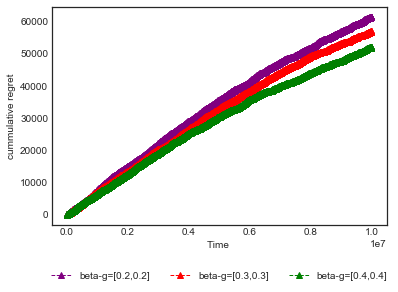

In [34]:
#############################################Plotting Regret of our algorithm with different Beta_g's############################
import numpy as np
import matplotlib.pyplot as plt
# from sctimipy.signal import savgol_filter
np.set_printoptions(precision=4)  # For compact display.
plt.style.use('seaborn-white')
fig = plt.figure()
ax = plt.subplot(111)
ax.plot(time,list_total_regret_ouralgo1,label='beta-g=[0.2,0.2]',color='purple',marker='^',linestyle='--',linewidth=1)
ax.plot(time,list_total_regret_ouralgo2,label='beta-g=[0.3,0.3]',color='red',marker='^',linestyle='--',linewidth=1)
ax.plot(time,list_total_regret_ouralgo,label='beta-g=[0.4,0.4]',color='green',marker='^',linestyle='--',linewidth=1)

plt.title('')
ax.set_xlabel('Time ')
ax.set_ylabel('cummulative regret')

ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.30), shadow=True, ncol=10)
plt.show()
fig.savefig('a2.png')
#################################################################################


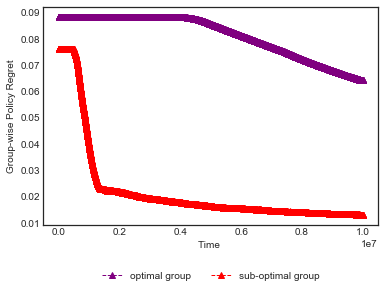

In [35]:
#######################################Plotting Exposure Fair Regret of our algorithm for two groups######################
import numpy as np
import matplotlib.pyplot as plt
# from sctimipy.signal import savgol_filter
np.set_printoptions(precision=4)  # For compact display.
plt.style.use('seaborn-white')
fig = plt.figure()
ax = plt.subplot(111)
ax.plot(time,list_exposure_fair_group1,label='optimal group',color='purple',marker='^',linestyle='--',linewidth=1)
ax.plot(time,list_exposure_fair_group2,label='sub-optimal group',color='red',marker='^',linestyle='--',linewidth=1)

plt.title('')
ax.set_xlabel('Time ')
ax.set_ylabel('Group-wise Policy Regret')

ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.30), shadow=True, ncol=10)
plt.show()
fig.savefig('a2.png')

In [36]:
#######################################Plotting Group Fair Regret of our algorithm for two groups######################
import numpy as np
import matplotlib.pyplot as plt
# from sctimipy.signal import savgol_filter
group1=[]
group2=[]
tt=0
for i in time:
  group1.append(list_N_g_t_ouralgo[tt][0] - beta_g[0]*i)
  group2.append(list_N_g_t_ouralgo[tt][1] - beta_g[1]*i)
  tt=tt+1
print(list_N_g_t_ouralgo)
np.set_printoptions(precision=4)  # For compact display.
plt.style.use('seaborn-white')
fig = plt.figure()
ax = plt.subplot(111)
ax.plot(time,group1,label='optimal group',color='purple',marker='^',linestyle='--',linewidth=1)
ax.plot(time,group2,label='sub-optimal group',color='red',marker='^',linestyle='--',linewidth=1)

plt.title('')
ax.set_xlabel('Time ')
ax.set_ylabel('Group Fair Regret')

ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.30), shadow=True, ncol=10)
plt.show()
fig.savefig('a2.png')

NameError: name 'beta_g' is not defined

In [ ]:
print(list_N_g_t_ouralgo)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
# from sctimipy.signal import savgol_filter
np.set_printoptions(precision=4)  # For compact display.
plt.style.use('seaborn-white')
fig = plt.figure()
ax = plt.subplot(111)
ax.plot(time,list_total_reward_ouralgo,label='BF-UCB',color='purple',marker='^',linestyle='--',linewidth=1)
ax.plot(time,list_total_reward_UCB,label='UCB',color='red',marker='^',linestyle='--',linewidth=1)
ax.plot(time,list_total_reward_EF,label='EF',color='green',marker='^',linestyle='--',linewidth=1)
ax.plot(time,list_total_reward_GF,label='GF',color='yellow',marker='^',linestyle='--',linewidth=1)

plt.title('')
ax.set_xlabel('Time ')
ax.set_ylabel('cummulative reward')

ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.30), shadow=True, ncol=10)
plt.show()
fig.savefig('a2.png')
#################################################################################
print("Arm_prob",len(arm_prob),arm_prob)
print("group_to arm",group_to_arm)


In [ ]:
  # [351815, 648185]    [618183, 381817]       [354577, 645423],       [256646, 743354]
import pandas as pd

plotdata = pd.DataFrame({
  "BF-UCB":N_g_t_ouralgo,
  "EF": N_g_t_EF,
  "GF":N_g_t_GF,
  "UCB": N_g_t_UCB },
  index=["Group 0","Group 1"])

plotdata.plot(kind="bar",figsize=(15, 8))

plt.title("within Group exposure")

plt.xlabel("Groups Indices")

plt.ylabel("Number of Pulls")

In [ ]:
print("All N_t's")
print("our algo", N_t_ouralgo)
print("UCB", N_t_UCB)
print("GF", N_t_GF)
print("EF", N_t_EF)